```
Análise dos dados do Senado
CEAPS (Cota para Exercício da Atividade Parlamentar dos Senadores)
```

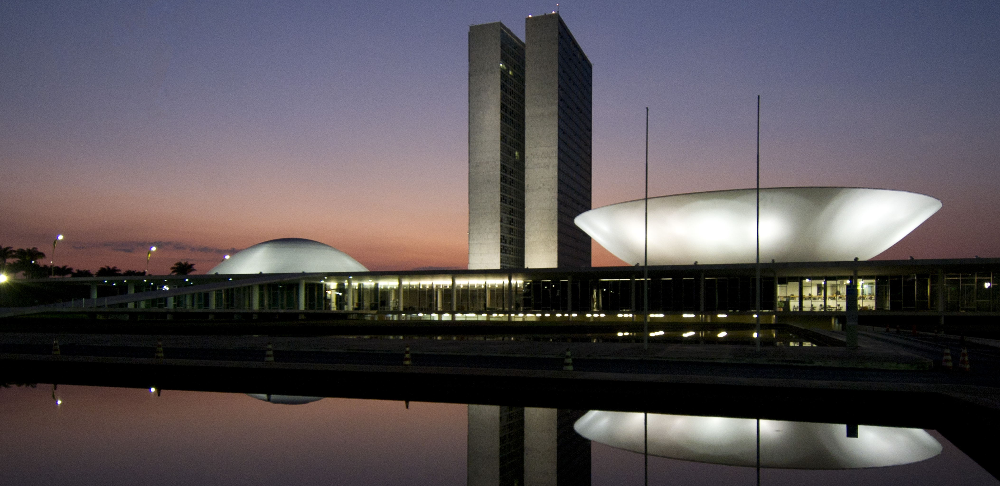

> Observação: A cúpula menor, voltada para baixo, abriga o Plenário do Senado Federal.<br>
> Disponível em https://www2.congressonacional.leg.br/visite/arquitetura. Acesso em 19/04/2022.

# Head

In [ ]:
# by geanclm in 19/04/2022

# Challenge

In [28]:
# Encontrar possíveis inconsistências na base e analisar gastos

# Local files

In [36]:
!dir img\ .

 O volume na unidade C ‚ Windows
 O N£mero de S‚rie do Volume ‚ 2656-7D0D

 Pasta de C:\Users\geanc\Downloads\DATA SCIENCE\7DaysOfCode\img

19/04/2022  09:22    <DIR>          .
19/04/2022  09:22    <DIR>          ..
19/04/2022  09:19         9.289.239 Senado.png
               1 arquivo(s)      9.289.239 bytes

 Pasta de C:\Users\geanc\Downloads\DATA SCIENCE\7DaysOfCode

19/04/2022  09:20    <DIR>          .
19/04/2022  09:20    <DIR>          ..
19/04/2022  08:51    <DIR>          .ipynb_checkpoints
19/04/2022  09:20        12.401.567 Despesas_CEAPS_2022_csv.ipynb
19/04/2022  08:45         1.029.260 despesa_ceaps_2022.csv
19/04/2022  09:22    <DIR>          img
               2 arquivo(s)     13.430.827 bytes
               4 pasta(s)   624.502.030.336 bytes dispon¡veis


# Import Libs

In [24]:
import pandas as pd
import plotly.offline as py
import plotly.graph_objs as go
import matplotlib.pyplot as plt

# biblioteca para visualizar os dados faltantes do data frame
# Obs: pip install missingno
import missingno

# Load Dataset

[Dataset](https://www12.senado.leg.br/transparencia/dados-abertos-transparencia/dados-abertos-ceaps?utm_source=ActiveCampaign&utm_medium=email&utm_content=%237DaysOfCode+-+Ci%C3%AAncia+de+Dados+1%2F7%3A+Data+Cleaning+and+Preparation&utm_campaign=%5BAlura+%237Days+Of+Code%5D%28Java%29+Dia+1%2F7%3A+Consumir+uma+API+de+filmes)

In [11]:
# arquivo .xls com colunas separadas por vírgula,
# código "cp1252" de conversão adequado para essa importação 
# necessário retirar a primeira linha para melhor visualização do Dataframe.

# importando apenas as colunas estratégiscas!
# A coluna 'ANO' e a coluna 'MES' não são necessárias para importação
# e quebram a regra da normaliação de banco de dados.
# A coluna 'DATA' pode ser importada para o formato correto dentro do pandas

df = pd.read_csv('despesa_ceaps_2022.csv', sep =';', encoding='cp1252', dayfirst=True,
                 skiprows=1, decimal=',', thousands='.', parse_dates=['DATA'],
                 usecols=[2,3,4,5,6,7,8,9,10])

<center style="font-size:18pt; background-color:orange">
    <br/><b>DADOS FALTANTES NA BASE DO SENADO</b><br>&nbsp;</center>

In [22]:
# Ausência de entrega de alguns documentos no campo "DOCUMENTO"
# Falta de dados para o DETALHAMENTO
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3906 entries, 0 to 3905
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   SENADOR            3906 non-null   object        
 1   TIPO_DESPESA       3906 non-null   object        
 2   CNPJ_CPF           3906 non-null   object        
 3   FORNECEDOR         3906 non-null   object        
 4   DOCUMENTO          3734 non-null   object        
 5   DATA               3906 non-null   datetime64[ns]
 6   DETALHAMENTO       1996 non-null   object        
 7   VALOR_REEMBOLSADO  3906 non-null   float64       
 8   COD_DOCUMENTO      3906 non-null   int64         
dtypes: datetime64[ns](1), float64(1), int64(1), object(6)
memory usage: 274.8+ KB


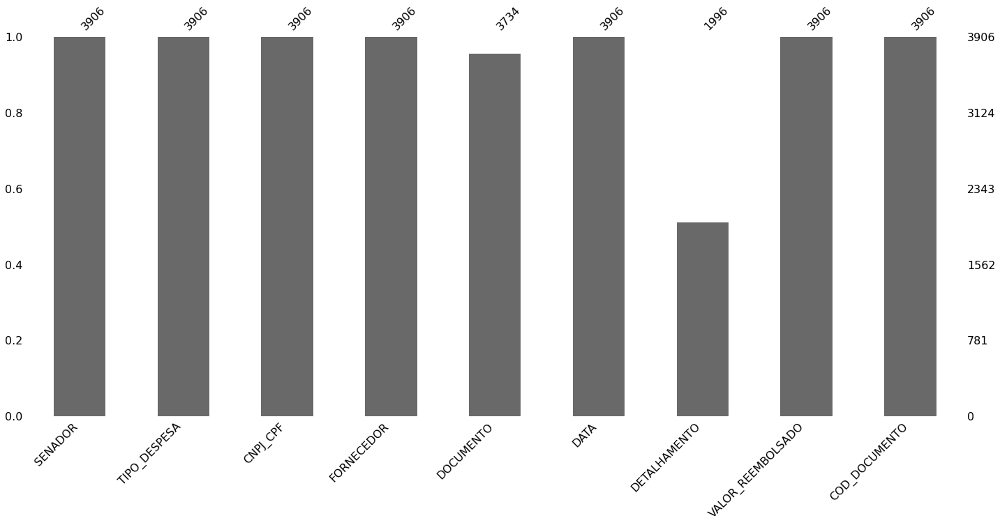

In [53]:
missingno.bar(df);

<center style="font-size:18pt; background-color:orange">
    <br/><b>RELAÇÃO PARCIAL DO MAIOR E MENOR REEMBOLSO</b><br>&nbsp;</center>

In [33]:
df.describe()

,VALOR_REEMBOLSADO,COD_DOCUMENTO
count,3906.000000,3.906000e+03
mean,1641.391124,2.175653e+06
std,3109.638545,1.451710e+03
min,0.010000,2.172906e+06
25%,218.962500,2.174460e+06
50%,544.970000,2.175678e+06
75%,1993.182500,2.176866e+06
max,77012.000000,2.178296e+06


In [16]:
# total de reembolso até o momento desta análise
df['VALOR_REEMBOLSADO'].sum()

6411273.73

<center style="font-size:18pt; background-color:orange">
    <br/><b>OS CINCO MAIORES REEMBOLSOS</b><br>&nbsp;</center>

In [19]:
df.groupby('SENADOR')['VALOR_REEMBOLSADO'].sum().sort_values(ascending=False).head()

SENADOR
CHICO RODRIGUES       157783.49
OMAR AZIZ             150724.14
RANDOLFE RODRIGUES    149901.92
MAILZA GOMES          149071.35
SÉRGIO PETECÃO        146398.88
Name: VALOR_REEMBOLSADO, dtype: float64

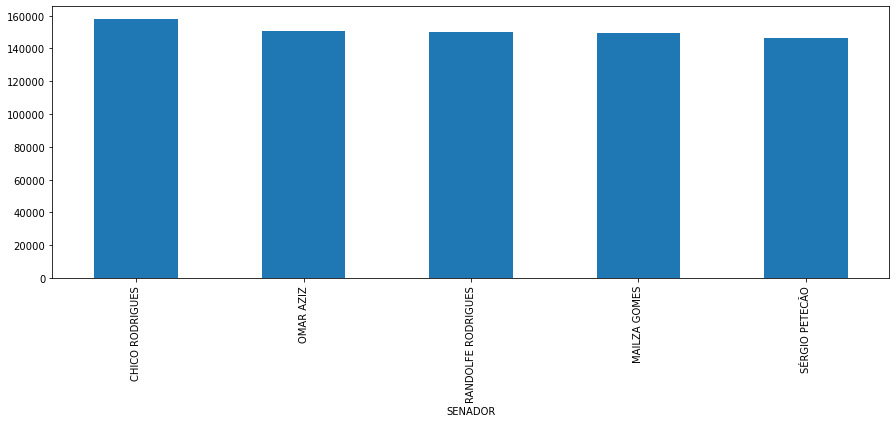

In [21]:
plt.figure(figsize=(15,5))
df.groupby('SENADOR')['VALOR_REEMBOLSADO'].sum().sort_values(ascending=False).head().plot.bar();

<center style="font-size:18pt; background-color:orange">
    <br/><b>OS CINCO MAIORES REEMBOLSOS</b><br>&nbsp;</center>

In [52]:
df.nlargest(5,'VALOR_REEMBOLSADO')

,SENADOR,TIPO_DESPESA,CNPJ_CPF,FORNECEDOR,DOCUMENTO,DATA,DETALHAMENTO,VALOR_REEMBOLSADO,COD_DOCUMENTO
3304,SÉRGIO PETECÃO,"Contratação de consultorias, assessorias, pesq...",12.980.692/0001-60,P. H. A. RAMALHO - ME,66,2022-02-28,NaN,77012.0,2175346
2654,NELSINHO TRAD,"Contratação de consultorias, assessorias, pesq...",37.195.146/0001-40,Home Mix Produção e Assessoria em Radiodifusão...,0007620,2022-03-03,"Referente ao pagamento no mês de março, da pre...",30000.0,2175716
2662,NELSINHO TRAD,Divulgação da atividade parlamentar,23.187.261/0001-68,L&L CONSULTORIA LTDA,00000087,2022-04-04,Referente ao pagamento de divulgação de ativid...,30000.0,2177733
2716,OMAR AZIZ,"Contratação de consultorias, assessorias, pesq...",15.183.160/0001-90,UPLINK Assessoria e Consultoria Empresarial Ei...,509,2022-01-24,Serviço de consultoria em comunicação e market...,30000.0,2173233
2718,OMAR AZIZ,"Contratação de consultorias, assessorias, pesq...",15.183.160/0001-90,UPLINK Assessoria e Consultoria Empresarial Ei...,518,2022-02-09,Serviço de consultoria em comunicação e market...,30000.0,2174338


<center style="font-size:18pt; background-color:orange">
    <br/><b>OS CINCO MENORES REEMBOLSOS</b><br>&nbsp;</center>

In [36]:
df.nsmallest(5,'VALOR_REEMBOLSADO')

,SENADOR,TIPO_DESPESA,CNPJ_CPF,FORNECEDOR,DOCUMENTO,DATA,DETALHAMENTO,VALOR_REEMBOLSADO,COD_DOCUMENTO
317,CARLOS PORTINHO,"Passagens aéreas, aquáticas e terrestres nacio...",09.296.295/0001-60,AZUL,MGMLGZ,2022-01-19,"Companhia Aérea: AZUL, Localizador: MGMLGZ. Pa...",0.01,2173057
318,CARLOS PORTINHO,"Passagens aéreas, aquáticas e terrestres nacio...",09.296.295/0001-60,AZUL,NN2E6U,2022-01-19,"Companhia Aérea: AZUL, Localizador: NN2E6U. Pa...",3.00,2173056
2782,PAULO PAIM,"Contratação de consultorias, assessorias, pesq...",01.109.184/0004-38,UNIVERSO ONLINE SA,104702039,2022-02-17,Despesa com serviço de suporte técnico em info...,3.94,2175104
2390,MAILZA GOMES,"Locomoção, hospedagem, alimentação, combustíve...",11.849.896/0001-02,PLANALTO BITTAR HOTEL LTDA,20800,2022-03-31,NaN,6.00,2177614
1349,FLÁVIO ARNS,Aquisição de material de consumo para uso no e...,07.510.879/0001-60,AGILIZA LOCADORA DE EQUEPAMENTOS LTDA ME,27400,2022-03-01,NaN,6.20,2177295


<center style="font-size:18pt; background-color:orange">
    <br/><b>REEMBOLSO MAIS FREQUENTE:<br><br>
    Locomoção, hospedagem, alimentação, combustíveis</b><br/>&nbsp;</center>

In [37]:
df['TIPO_DESPESA'].value_counts()

Locomoção, hospedagem, alimentação, combustíveis e lubrificantes                                                                                                                                   1396
Aluguel de imóveis para escritório político, compreendendo despesas concernentes a eles.                                                                                                            824
Passagens aéreas, aquáticas e terrestres nacionais                                                                                                                                                  754
Divulgação da atividade parlamentar                                                                                                                                                                 334
Aquisição de material de consumo para uso no escritório político, inclusive aquisição ou locação de software, despesas postais, aquisição de publicações, locação de móveis e de equipamentos.      306


<center style="font-size:18pt; background-color:orange">
    <br/><b>MAIOR GASTO: CONSULTORIAS</b><br/>&nbsp;</center>

In [38]:
df.groupby('TIPO_DESPESA')['VALOR_REEMBOLSADO'].sum().sort_values(ascending=False)

TIPO_DESPESA
Contratação de consultorias, assessorias, pesquisas, trabalhos técnicos e outros serviços de apoio ao exercício do mandato parlamentar                                                             1560223.33
Passagens aéreas, aquáticas e terrestres nacionais                                                                                                                                                 1360694.18
Locomoção, hospedagem, alimentação, combustíveis e lubrificantes                                                                                                                                   1163391.33
Divulgação da atividade parlamentar                                                                                                                                                                1040156.25
Aluguel de imóveis para escritório político, compreendendo despesas concernentes a eles.                                                                           

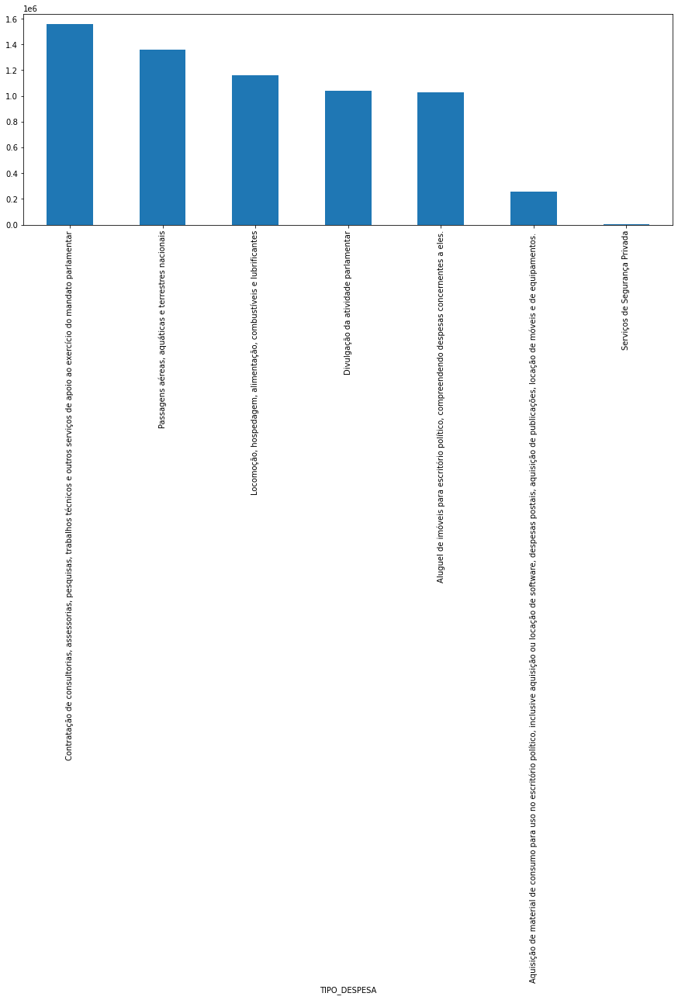

In [42]:
plt.figure(figsize=(15,5))
df.groupby('TIPO_DESPESA')['VALOR_REEMBOLSADO'].sum().sort_values(ascending=False).plot.bar();

<center style="font-size:18pt; background-color:orange">
    <br/><b>ANÁLISE DE GASTOS JANEIRO/2022</b><br/>&nbsp;</center>

In [73]:
df[(df['DATA'].dt.year == 2022) & (df['DATA'].dt.month == 1)].describe()

,VALOR_REEMBOLSADO,COD_DOCUMENTO
count,965.000000,9.650000e+02
mean,1498.556093,2.174133e+06
std,2795.324541,9.850274e+02
min,0.010000,2.172907e+06
25%,200.000000,2.173415e+06
50%,423.230000,2.173873e+06
75%,1694.000000,2.174584e+06
max,30000.000000,2.178049e+06


<center style="font-size:18pt; background-color:orange">
    <br/><b>DADOS DE OUTROS ANOS NA BASE 2022</b><br/>&nbsp;</center>

In [79]:
# Período inicial no Dataframe
df['DATA'].min()

Timestamp('2002-02-02 00:00:00')

In [78]:
# Período final no Dataframe
df['DATA'].max()

Timestamp('2022-04-12 00:00:00')

In [82]:
df[(df['DATA'].dt.year == 2002) & (df['DATA'].dt.month == 2)]

,SENADOR,TIPO_DESPESA,CNPJ_CPF,FORNECEDOR,DOCUMENTO,DATA,DETALHAMENTO,VALOR_REEMBOLSADO,COD_DOCUMENTO
2817,PAULO ROCHA,"Aluguel de imóveis para escritório político, c...",02.558.157/0001-62,Telefônica do Brasil S.A.,1129495338,2002-02-11,NaN,1106.13,2174871
3170,ROGÉRIO CARVALHO,"Passagens aéreas, aquáticas e terrestres nacio...",34.848.898/0001-74,Peakalika Turismo,SRPSJX,2002-02-02,"Companhia Aérea: LATAM, Localizador: SRPSJX. P...",2260.60,2174993


In [81]:
df[(df['DATA'].dt.year == 2020) & (df['DATA'].dt.month == 2)].describe()

,VALOR_REEMBOLSADO,COD_DOCUMENTO
count,1.0,1.0
mean,385.0,2175273.0
std,NaN,NaN
min,385.0,2175273.0
25%,385.0,2175273.0
50%,385.0,2175273.0
75%,385.0,2175273.0
max,385.0,2175273.0


<center style="font-size:18pt; background-color:orange">
    <br/><b>CONCENTRAÇÃO DE GASTOS POR PERÍODO</b><br/>&nbsp;</center>

In [68]:
trace = go.Scatter(x = df['DATA'],
                   y = df['VALOR_REEMBOLSADO'],
                   mode = 'markers')
data=[trace]
layout = go.Layout(title='Análise gastos CEAPS',
                   yaxis={'title':'Valor reembolso'},
                   xaxis={'title': 'Despesas CEAPS 2022'})
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

<center style="font-size:18pt; background-color:#2a6523">
    <br/><b><FONT COLOR="#ffffff">Insights</FONT></b><br/>&nbsp;</center>

* Importante ter arquivo metadados para melhor entendimento de cada coluna
* Na base 2022 têm registros de pendências de outro período que não o de 2022
* Ausência de dados nos campos DETALHAMENTO e DOCUMENTO
* Maior concentração de gastos pós pandemia